In [ ]:
import os

#### DO NOT DELETE THIS COMMENT ####
from google.colab import drive

### mount your google drive
drive.mount('/content/drive')

# add your local project folder to be able to import all utils files
path = "/content/drive/My Drive/Colab Notebooks" # change this to your local project folder
os.chdir(path)

#### DO NOT DELETE THIS COMMENT ####

In [ ]:
path_to_zip = "data.zip"

In [ ]:
!unzip $path_to_zip

In [3]:
# Verify that the data is found.
# The data is stored in ZARR format, an efficient format for large datasets.
# The data is stored in a folder structure that is similar to the Kaggle dataset.
import os
import glob
fls = glob.glob(os.path.join("dsb2018", "train", "*.zarr"))
print(f"Found {len(fls)} files.")
print(f"Example file: {fls[0]}")

Found 30 files.
Example file: dsb2018\train\02903040e19ddf92f452907644ad3822918f54af41dd85e5a3fe3e1b6d6f9339.zarr


## Install and import packages

In [ ]:
!pip install numpy pillow matplotlib scikit-image zarr torch torchvision torchsummary tensorboard mahotas albumentations tqdm

In [1]:
%matplotlib inline

%load_ext autoreload
%autoreload 2

import glob
import os
import datetime

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import zarr
import albumentations as A

from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch.utils.tensorboard import SummaryWriter
from torchsummary import summary

from utils.label import PredictionType
from utils.helper import print_reference_summary
from utils.train_val_test import (
    epoch_train_val_routine,
    step_train_val_routine,
    simple_test,
    test_evaluation_routine,
)
from utils.visualize import (
    plot_image,
    plot_random_image,
    show_predictions,
)

plt.rcParams['image.cmap'] = 'gist_earth'
torch.backends.cudnn.benchmark = True

C:\Users\ckarg\AppData\Roaming\Python\Python39\site-packages\albumentations\__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


# 1. Data
For this task we use a subset of the data used in the kaggle data science bowl 2018 challenge (https://www.kaggle.com/c/data-science-bowl-2018/).

## Raw Data

Example image:

![kaggle_example](https://data.broadinstitute.org/bbbc/BBBC038/BBBC038exampleimage1.png)

All images show cell nuclei recorded using different microscopes and lighting conditions. There are 30 images in the training set, 8 in the validation set and 16 in the test set.

## Ground Truth Labels

The dataset also contains the ground truth segmentation labels in form of segmentation masks.
In this exercise we consider both 2-class and 3-class segmentation:
- 2-class: Foreground (1) / Background (0)
- 3-class: Background (0), Interior (1), Boundary (2)

We will focus on the 2-class case, but feel free to try the 3-class case as well.
Execute the next two cells repeatedly to have a look at some example images with their ground truth segmentation labels.
The original images of the datatset are greyscale images of size 360x360.

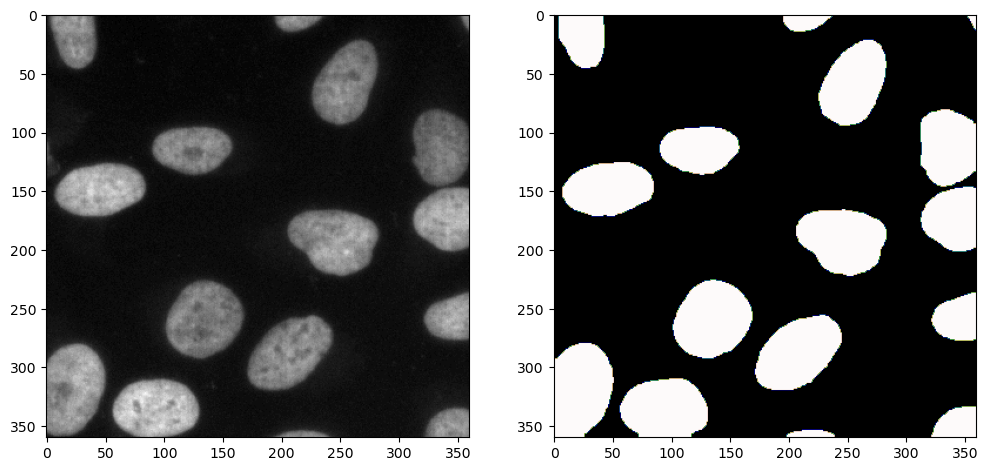

In [2]:
# 2-class segmentation
# Repeatedly execute this cell to get different images
plot_random_image(PredictionType.TWO_CLASS)

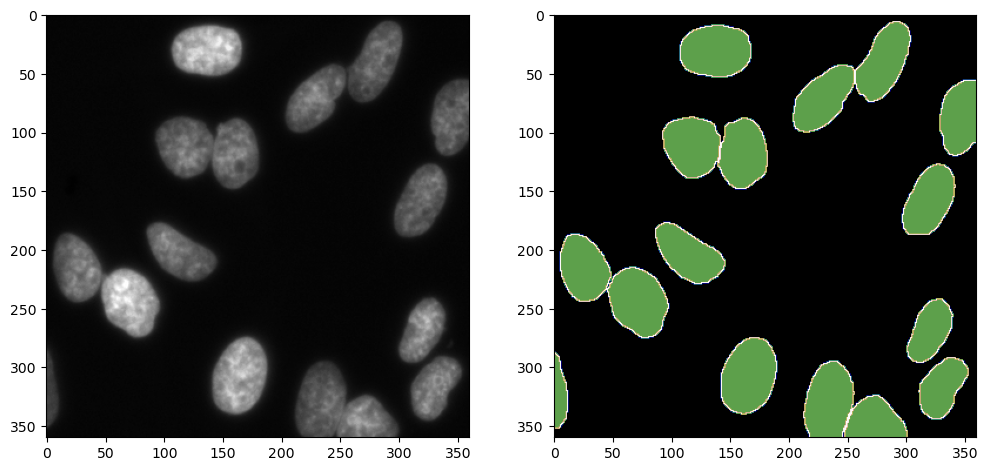

In [3]:
# 3-class segmentation
# Repeatedly execute this cell to get different images
plot_random_image(PredictionType.THREE_CLASS)

## Load the data

Here we implement a custom dataset for the kaggle data.
Look at the code to briefly get an understanding what happens.

For more information, you can look here:
https://pytorch.org/docs/stable/data.html
https://pytorch.org/tutorials/beginner/data_loading_tutorial.html

### Augmentation & Padding

Especially when the size of the dataset is limited, data augmentation is essential to get good results.
Extend your data loader to augment your data during training on the fly.
Think about what kind of augmentation to use (e.g. flips, rotation, elastic).

Here, we have prepared the code to use the external data augmentation library **albumentations**.

In [4]:
class KaggleDSB_dataset(Dataset):
    """(Subset of the) Kaggle Data Science Bowl 2018 dataset."""

    def __init__(
        self,
        root_dir,
        mode,
        prediction_type,
        padding_size=None
    ):
        self.mode = mode
        self.files = glob.glob(os.path.join(root_dir, mode, "*.zarr"))
        self.prediction_type = prediction_type
        self.padding_size = padding_size
        self.define_augmentation()
        self.define_padding()

    def __len__(self):
        return len(self.files)

    def define_augmentation(self):
        """Define the augmentation pipeline using Albumentations."""
        if self.mode == "train":
            ###########################################################################
            # OPTIONAL TASK
            # TODO: Implement image augmentations of your choice using Albumentations.
            # Image augmentations are a useful tool to improve model performance.
            ###########################################################################
            # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

            augmentation_list = [
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5),
                A.Rotate(limit=45, border_mode=0, p=0.7),
            ]

            # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
            ###########################################################################
            #                             END OF YOUR CODE                            #
            ###########################################################################

            self.aug_transform = A.Compose(augmentation_list)
        else:
            self.aug_transform = A.Compose([])

    def define_padding(self):
        """Define the initial padding of the images."""
        if self.padding_size is not None:

            ###########################################################################
            # TASK 1
            # TODO: Pad the images initially with the given padding size.
            # Hint: Albumentations does not have a native A.Pad method, you need to
            # work with A.Lambda in this case.
            ###########################################################################
            # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

            pad = self.padding_size
            def pad_image(image, **kwargs):
                return np.pad(
                    image,
                    ((pad, pad), (pad, pad), (0, 0)),
                    mode='constant',
                    constant_values=0
                )

            self.pad_transform = A.Compose([
                A.Lambda(image=pad_image, mask=pad_image)
            ])

            # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
            ###########################################################################
            #                             END OF YOUR CODE                            #
            ###########################################################################
        else:
            self.pad_transform = A.Compose([])

    def get_filename(self, idx):
        """Get the filename of the idx-th sample."""
        return self.files[idx]

    def __getitem__(self, idx):
        fn = self.get_filename(idx)
        raw, label = self.load_sample(fn)
        raw = self.normalize(raw)

        # Padding
        if self.padding_size is not None:
            raw = np.transpose(raw, [1, 2, 0])  # CHW -> HWC
            label = np.transpose(label, [1, 2, 0])  # CHW -> HWC
            padded = self.pad_transform(image=raw, mask=label)
            raw = padded["image"]
            label = padded["mask"]
            raw = np.transpose(raw, [2, 0, 1])  # HWC -> CHW
            label = np.transpose(label, [2, 0, 1])  # HWC -> CHW

        # Augmentation (only during training)
        if self.mode == "train":
            raw = np.transpose(raw, [1, 2, 0])  # CHW -> HWC
            label = np.transpose(label, [1, 2, 0])  # CHW -> HWC
            raw, label = self.augment_sample(raw, label)
            raw = np.transpose(raw, [2, 0, 1])  # HWC -> CHW
            label = np.transpose(label, [2, 0, 1])  # HWC -> CHW

        raw, label = torch.tensor(raw.copy(), dtype=torch.float32), torch.tensor(label.copy(), dtype=torch.float32)
        return raw, label

    def augment_sample(self, raw, label):
        """Apply Albumentations augmentations."""
        augmented = self.aug_transform(image=raw, mask=label)
        raw_aug = augmented["image"]
        label_aug = augmented["mask"]
        return raw_aug, label_aug

    @staticmethod
    def normalize(raw):
        """Normalize the raw image to zero mean and unit variance."""
        raw -= np.mean(raw)
        raw /= np.std(raw)
        return raw

    def load_sample(self, filename):
        """Load a sample from a Zarr file."""
        data = zarr.open(filename)
        raw = np.array(data['volumes/raw'])

        if self.prediction_type == PredictionType.TWO_CLASS:
            label = np.array(data['volumes/gt_fgbg'])
        elif self.prediction_type == PredictionType.THREE_CLASS:
            label = np.array(data['volumes/gt_threeclass'])
        else:
            raise NotImplementedError

        label = label.astype(np.float32)
        return raw, label


### Check the data
Look at the training data to see if your dataset and data loader are working and,
if you are using augmentation, if the augmentation looks reasonable.

In [5]:
prediction_type = PredictionType.TWO_CLASS
padding_size = 3
tmp_data = KaggleDSB_dataset(root_dir="dsb2018", mode="train", prediction_type=prediction_type, padding_size=padding_size)
sample_idx = 0
img, label = tmp_data[sample_idx] # Get image and label of a dataset sample
print(f"The dataset has {len(tmp_data)} samples.")
print(f"The shape of the padded image is: {img.shape}")
print(f"The shape of the padded label is: {label.shape}")
print("\n")
print("Correct shape after padding for reference: ", (1, 360 + 2*padding_size, 360 + 2*padding_size))

The dataset has 30 samples.
The shape of the padded image is: torch.Size([1, 366, 366])
The shape of the padded label is: torch.Size([1, 366, 366])


Correct shape after padding for reference:  (1, 366, 366)


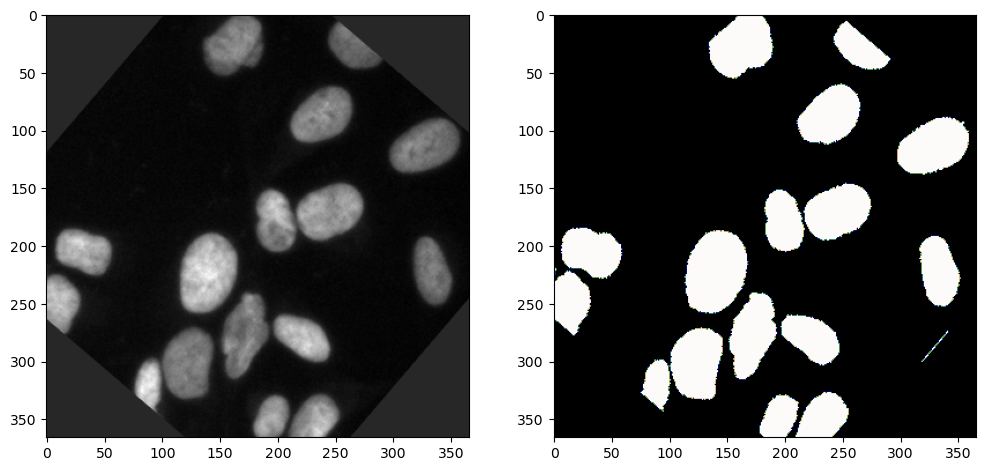

In [6]:
# Let's look at our augmented data (in case you implemented augmentations).
# Run this cell multiple times to see how the augmentation parameters affects the sample image and label.
img_tmp, label_tmp = tmp_data[sample_idx]
plot_image(img_tmp, label_tmp, prediction_type=prediction_type)

# 2. U-Net

We make use of the U-Net achitecture for image segmentation. Your task is to implement it and use it to segment the dataset described above.
The U-Net is a popular core architecture for segmentation and extensively used for medical and biological data.

![unet](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)

You might want to read the paper: [U-Net: Convolutional Networks for BiomedicalImage Segmentation](https://arxiv.org/pdf/1505.04597.pdf). It has been hugely influential in the field and it is very concise and understandable.
We recommend asking your colleagues on the moodle forums with respect to unclear aspects of the architecture.
(If that does not solve it, there are also a number of tutorials online).

### Convolutional Pass

We start by implementing a convolutional pass. This is a series of convolutions, each followed by an activation function.
You can see where the convolutional pass is used in the U-Net architecture in the image below.

NOTE: The original U-Net paper uses VALID (= NO) padding, i.e. each convolution reduces the spatial size of the input by 2 (as shown in the architecture figure). However, modern implementations of U-Nets use SAME padding, i.e. the convolutions keep the spatial size of the input unchanged (using an approptiate choice of padding). In this exercise we will only use SAME padding.

![conv_pass](./images/u-net-architecture-conv.png)

In [7]:
###########################################################################
# TASK 2
#
# TODO: Your task is to implement the ConvPass module, which is a building
# block of a U-Net architecture.
#
# The ConvPass should consist of a sequence of convolution layers, each 
# followed by an activation function (e.g., ReLU), applied to the input 
# tensor. 
#
# Requirements:
# - Use the given constructor signature (do not change it).
# - Apply the number of convolutions based on the `kernel_sizes` (also known as filter size) list 
#   (each entry defines one convolutional layer).
# - Use SAME padding so that the output size remains the same as the input size.
# - Apply the specified activation function after each convolution.
###########################################################################


class ConvPass(torch.nn.Module):
    """Convolutional pass of a U-Net."""
    def __init__(
            self,
            in_channels,
            out_channels,
            kernel_sizes,
            activation
    ):
        """Constructor of a convolutional pass.
        The pass consists of a series of convolutions, each followed by an activation function.

        Args:
            in_channels:
                Number of input channels
            out_channels:
                Number of output channels
            kernel_sizes:
                List of kernel sizes
            activation:
                String name of the activation function, e.g. 'ReLU'
        """

        super(ConvPass, self).__init__()

        if activation is not None:
            activation = getattr(torch.nn, activation)

        layers = []
        for kernel_size in kernel_sizes:
            self.dims = len(kernel_size)
            pad = tuple(np.array(kernel_size) // 2) # We want same padding, i.e. the output size is the same as the input size
            layers.append(torch.nn.Conv2d(in_channels, out_channels, kernel_size,
                                          padding=pad))
            in_channels = out_channels

            if activation is not None:
                layers.append(activation())
        self.conv_pass = torch.nn.Sequential(*layers)


    def forward(self, x):
        """Forward pass of the convolutional pass.

        Args:
            x:
                Input tensor

        Returns:
            Output tensor after applying the convolutional pass

        """
        c = self.conv_pass(x)
        return c

### Test your convolutional pass

You can check if your convolutional pass works as expected with the following test.

In [8]:
input = torch.zeros((1, 3, 10, 10))
kernels = [[3, 3], [3, 3]]
activation = "ReLU"

c = ConvPass(3, 3, kernels, activation)
output = c(input)

print("Output shape with SAME padding: ", output.shape)
print("Correct output shape for reference: (1, 3, 10, 10)")

Output shape with SAME padding:  torch.Size([1, 3, 10, 10])
Correct output shape for reference: (1, 3, 10, 10)


### Downsample

Next, we implement a downsampling layer. This layer is used in the U-Net to reduce the spatial dimensions of the input tensor.

You can see where the downsample pass is used in the U-Net architecture in the image below.

![conv_pass](./images/u-net-architecture-down.png)

In [9]:
###########################################################################
# TASK 3
#
# TODO: Your task is to implement the Downsample module used in the U-Net 
# architecture. This module performs spatial downsampling using a 
# MaxPooling layer.
#
# Requirements:
# - Use the given constructor signature (do not modify it).
# - Use Max Pooling for downsampling.
# - Use the same `downsample_factor` for both the pooling kernel (aka filter) size and 
#   the stride so that pooling is non-overlapping.
#
# Optional:
# - Implement an assertion method (`assert_downsample_factor`) that checks 
#   whether the input shape is divisible by the downsampling factor in each 
#   spatial dimension. If not, raise a Warning for the user indicating the potential loss of information.
###########################################################################


class Downsample(torch.nn.Module):
    """Downsampling layer of a U-Net."""

    def __init__(
            self,
            downsample_factor
    ):
        """Constructor of a downsampling layer.

        Args:
            downsample_factor:
                Factor by which to downsample the input tensor.

        """
        super(Downsample, self).__init__()
        self.dims = len(downsample_factor)
        self.downsample_factor = downsample_factor
        self.down = torch.nn.MaxPool2d(downsample_factor, stride=downsample_factor)


    def forward(self, x):
        """Forward pass of the downsampling layer.

        Args:
            x:
                Input tensor

        Returns:
            Output tensor after applying the downsampling layer
        """
        self.assert_downsample_factor(x)
        d = self.down(x)
        return d


    def assert_downsample_factor(self, x):
        """Assert if the downsample factor is compatible with the input tensor.

        Args:
            x:
                Input tensor

        Returns:
            True if the downsample factor is compatible with the input tensor, raises RuntimeError otherwise
        """
        for d in range(1, self.dims + 1):
            if x.size()[-d] % self.downsample_factor[-d] != 0:
                raise RuntimeError(
                    "Can not downsample shape %s with factor %s, mismatch in spatial dimension %d" % (
                        x.size(),
                        self.downsample_factor,
                        self.dims - d)
                )
        return True

### Test your downsample layer

You can check if your downsample layer works as expected with the following test.

In [10]:
input = torch.zeros((1, 3, 20, 20))
downsample_factor1 = [2, 2]
downsample_factor2 = [5, 10]

d1 = Downsample(downsample_factor1)
d2 = Downsample(downsample_factor2)

output1 = d1(input)
output2 = d2(input)

print("Output shape with downsample factor [2, 2]: ", output1.shape)
print("Correct output shape for reference: ", (1, 3, 10, 10))
print("Output shape with downsample factor [5, 10]: ", output2.shape)
print("Correct output shape for reference: ", (1, 3, 4, 2))

Output shape with downsample factor [2, 2]:  torch.Size([1, 3, 10, 10])
Correct output shape for reference:  (1, 3, 10, 10)
Output shape with downsample factor [5, 10]:  torch.Size([1, 3, 4, 2])
Correct output shape for reference:  (1, 3, 4, 2)


#### Upsample

Next, we implement an upsampling layer. This layer is used in the U-Net to increase the spatial dimensions of the input tensor.

There is two common ways to upsample a tensor:
1. Nearest neighbor interpolation
2. Transposed convolution

Your task is to implement both methods.
You can see where the upsample pass is used in the U-Net architecture in the image below.

![conv_pass](./images/u-net-architecture-up.png)

In [11]:
###########################################################################
# TASK 4
#
# TODO: Your task is to implement an Upsample module that is used in the decoder
# path of a U-Net architecture. This module increases the spatial resolution
# of feature maps and merges them with skip connections from the encoder.
#
# Requirements:
# - Use the given constructor signature (do not modify it).
# - The module should support two upsampling modes:
#   1. 'nearest': use nearest-neighbor upsampling, also called 'constant upsampling'.
#   2. 'transpose_conv': use transposed convolutions for learned upsampling.
# - Define a `center_crop` function used to align the spatial dimensions of the
#   tensors before concatenation.
# - In the forward method, upsample the tensor `g_out` and then perform a 
#   center crop on `f_left` to match the upsampled spatial size.
# - Finally, concatenate the two tensors along the channel dimension.
###########################################################################


class Upsample(torch.nn.Module):
    """Class that implements an upsampling layer."""

    def __init__(
            self,
            scale_factor,
            mode,
            in_channels,
            out_channels,
    ):
        """Constructor of an upsampling layer.

        Args:
            scale_factor:
                Factor by which to upsample the input tensor
            mode:
                Upsample mode, either 'nearest' or 'transpose_conv'
            in_channels:
                Number of input channels
            out_channels:
                Number of output channels

        """
        super(Upsample, self).__init__()

        self.dims = len(scale_factor)

        if mode == 'transpose_conv':
            self.up = torch.nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size=scale_factor,
                stride=scale_factor
            )
        elif mode == 'nearest':
            self.up = torch.nn.Upsample(
                scale_factor=tuple(scale_factor),
                mode=mode
            )
        else:
            raise RuntimeError("invalid mode")


    def center_crop(self, x, shape):
        """Center-crop x to match spatial dimensions given by shape.

        Args:
            x:
                The input tensor.
            shape:
                The target shape.

        Returns:
            The center-cropped tensor.

        """

        x_target_size = x.size()[:-self.dims] + shape

        offset = tuple(
            (a - b) // 2
            for a, b in zip(x.size(), x_target_size))

        slices = tuple(
            slice(o, o + s)
            for o, s in zip(offset, x_target_size))

        return x[slices]

    def forward(self, f_left, g_out):
        """Forward pass.

        Args:
            f_left:
                Input tensor from the left branch
            g_out:
                Input tensor from the previous layer

        Returns:
            Concatenated cropped f_left with upsampled cropped g_out

        """
        g_up = self.up(g_out)

        f_cropped = self.center_crop(f_left, g_up.size()[-self.dims:])

        f_right = torch.cat([f_cropped, g_up], dim=1)
        
        return f_right

### Test your upsample layer

In [12]:
scale_factor = [2, 2]
input = torch.zeros((1, 3, 10, 10))

f_left = torch.ones((1, 2, 20, 20)) * 2

# check size
u1 = Upsample(scale_factor, 'transpose_conv', 3, 2)
u2 = Upsample(scale_factor, 'nearest', 3, 2)

output1 = u1(f_left, input)
output2 = u1(f_left, input)


print("Output shape with transposed convolution: ", output1.shape)
print("Correct output shape for reference: ", (1, 4, 20, 20))
print("Output shape with nearest neighbor: ", output2.shape)
print("Correct output shape for reference: ", (1, 4, 20, 20))

Output shape with transposed convolution:  torch.Size([1, 4, 20, 20])
Correct output shape for reference:  (1, 4, 20, 20)
Output shape with nearest neighbor:  torch.Size([1, 4, 20, 20])
Correct output shape for reference:  (1, 4, 20, 20)


### UNet

It is time to assemble the U-Net. The U-Net consists of a series of convolutional passes, downsampling layers, and upsampling layers.



In [13]:
###########################################################################
# TASK 5
#
# TODO: Your task is to implement the `UNet` class, a flexible version of the 
# U-Net architecture widely used in image segmentation and related tasks.
#
# Requirements:
# - Use the provided constructor signature and base structure.
# - Build the U-Net recursively, with a configurable number of levels.
# - Use the helper modules you defined earlier:
#     - `ConvPass` for the convolutional blocks
#     - `Downsample` for max pooling/downsampling
#     - `Upsample` for upsampling (either via transposed convolution or 
#        nearest-neighbor interpolation)
#
# Design Constraints:
# - Do not hardcode the number of levels — this should be determined 
#   dynamically based on the `downsample_factors` list.
# - Do not restrict the output to task-specific channels (e.g., 1 output 
#   channel for binary segmentation). The number of output channels should 
#   be configurable via `num_fmaps_out`.
#
# Hints:
# - Use recursion in the `forward()` pass to handle U-Net depth dynamically.
# - Carefully manage feature map dimensions for skip connections and 
#   cropping during upsampling.
# - Initialize weights for conv layers using the provided `weights_init()` 
#   method.
###########################################################################


class UNet(torch.nn.Module):
    """UNet class."""

    def __init__(
            self,
            in_channels,
            num_fmaps,
            fmap_inc_factors,
            downsample_factors,
            kernel_size_down,
            kernel_size_up,
            activation,
            num_fmaps_out,
            constant_upsample
    ):
        """Unet constructor.

        Create a U-Net::

            f_in --> f_left --------------------------->> f_right--> f_out
                        |                                   ^
                        v                                   |
                     g_in --> g_left ------->> g_right --> g_out
                                 |               ^
                                 v               |
                                       ...

        where each ``-->`` is a convolution pass, each `-->>` a crop, and down
        and up arrows are max-pooling and transposed convolutions,
        respectively.

        The U-Net expects 2D tensors shaped like::

            ``(batch=1, channels, height, width)``.

        Args:

            in_channels:
                The number of input channels.
            num_fmaps:
                The number of feature maps in the first layer. This is also the
                number of output feature maps. Stored in the ``channels``
                dimension.
            fmap_inc_factors:
                By how much to multiply the number of feature maps between
                layers. If layer 0 has ``k`` feature maps, layer ``l`` will
                have ``k*fmap_inc_factor**l``.
            downsample_factors:
                List of tuples ``(y, x)`` to use to down- and up-sample the
                feature maps between layers.
            kernel_size_down:
                List of lists of kernel sizes. The number of sizes in a list
                determines the number of convolutional layers in the
                corresponding level of the build on the left side. Kernel sizes
                can be given as tuples or integer.
            kernel_size_up:
                List of lists of kernel sizes. The number of sizes in a list
                determines the number of convolutional layers in the
                corresponding level of the build on the right side. Within one
                of the lists going from left to right. Kernel sizes can be
                given as tuples or integer.
            activation:
                Which activation to use after a convolution. Accepts the name
                of any tensorflow activation function (e.g., ``ReLU`` for
                ``torch.nn.ReLU``).
            constant_upsample:
                If set to true, perform a constant (i.e. nearest) upsampling instead of a
                transposed convolution in the upsampling layers.

        """
        super(UNet, self).__init__()

        self.num_levels = len(downsample_factors) + 1
        self.in_channels = in_channels
        self.out_channels = num_fmaps_out if num_fmaps_out else num_fmaps
        self.mode = 'nearest' if constant_upsample else 'transpose_conv'
        self.kernel_size_down = kernel_size_down
        self.kernel_size_up = kernel_size_up
        self.downsample_factors = downsample_factors

        # left convolutional passes
        self.l_conv = nn.ModuleList([
            ConvPass(
                in_channels
                if level == 0
                else num_fmaps * fmap_inc_factors ** (level - 1),
                num_fmaps * fmap_inc_factors ** level,
                kernel_size_down[level],
                activation=activation)
            for level in range(self.num_levels)
        ])
        self.dims = self.l_conv[0].dims

        # left downsample layers
        self.l_down = nn.ModuleList([
            Downsample(downsample_factors[level])
            for level in range(self.num_levels - 1)
        ])

        # right up/crop/concatenate layers
        self.r_up = nn.ModuleList([
            Upsample(
                downsample_factors[level],
                mode=self.mode,
                in_channels=num_fmaps * fmap_inc_factors ** (level + 1),
                out_channels=num_fmaps * fmap_inc_factors ** (level + 1),
            )
            for level in range(self.num_levels - 1)
        ])

        # right convolutional passes
        self.r_conv = nn.ModuleList([
            ConvPass(
                num_fmaps * fmap_inc_factors ** level +
                num_fmaps * fmap_inc_factors ** (level + 1),
                num_fmaps * fmap_inc_factors ** level
                if num_fmaps_out is None or level != 0
                else num_fmaps_out,
                kernel_size_up[level],
                activation=activation)
            for level in range(self.num_levels - 1)
        ])
        self.weights_init()

    def weights_init(self):
        self.apply(self._init_weights)

    @staticmethod
    def _init_weights(m):
        if isinstance(m, nn.Conv2d):
            nn.init.xavier_uniform_(m.weight.data)
            m.bias.data.fill_(0.01)

        if isinstance(m, nn.ConvTranspose2d):
            nn.init.xavier_uniform_(m.weight.data)
            m.bias.data.fill_(0.01)


    def _rec_forward(self, level, f_in):
        # index of level in layer arrays
        i = self.num_levels - level - 1

        # convolve
        f_left = self.l_conv[i](f_in)

        # end of recursion
        if level == 0:
            fs_out = f_left
        else:
            # down
            g_in = self.l_down[i](f_left)
            # nested levels
            gs_out = self._rec_forward(level - 1, g_in)
            # up, concat, and crop
            fs_right = self.r_up[i](f_left, gs_out)

            # convolve
            fs_out = self.r_conv[i](fs_right)

        return fs_out
    

    def forward(self, x):
        """Forward pass through the network."

        Args:
            x:
                Input tensor of shape (b, c, y, x).

        Returns:
            The feature.

        """

        y = self._rec_forward(self.num_levels - 1, x)
        return y

# 3. Semantic Segmentation


Define your model for semantic segmentation, pick one segmentation task and print out your network summary. This also serves as a check if your network is built correctly.

In [14]:
##########################################################################
# TASK 6 
#
# TODO: Now that you have implemented the `UNet` architecture in Task 5, it's
# time to define a concrete instance of the model for a specific use case.
#
# Requirements:
# - Create a UNet model instance using the `UNet` class you implemented.
# - Your UNet should have the following configuration:
#     - 1 input channel (e.g., grayscale image)
#     - 8 feature maps in the first layer
#     - 8 feature maps in the last layer
#     - Feature maps should double at each level
#     - Use 4 downsampling steps, each with a downsampling factor of 2x2
#     - Use `'ReLU'` as the activation function
#     - Use transposed convolutions for upsampling
#     - Each ConvPass (on both down and up sides) should use two convolution layers with kernel size 3x3 (and SAME padding)
#
# Hint:
# - The number of levels in the UNet is implicitly defined by the number
#   of downsampling steps (`d_factors`).
##########################################################################

d_factors = [[2, 2], [2, 2], [2, 2], [2, 2]]

unet = UNet(
    in_channels=1,
    num_fmaps=8,
    fmap_inc_factors=2,
    downsample_factors=d_factors,
    activation='ReLU',
    num_fmaps_out=8,
    constant_upsample=False,
    kernel_size_down=[[(3, 3), (3, 3)]] * (len(d_factors) + 1),
    kernel_size_up=[[(3, 3), (3, 3)]] * len(d_factors),
)

In [15]:
# Choose a task here

#prediction_type = PredictionType.TWO_CLASS
prediction_type = PredictionType.THREE_CLASS

In [16]:
# Define the final segmentation task head

if prediction_type == PredictionType.TWO_CLASS:
    # NOTE: 2-class segmentation is a binary classification task and thus needs only one output channel
    out_channels = 1
    activation = torch.nn.Sigmoid()
    loss_fn = torch.nn.BCEWithLogitsLoss()
elif prediction_type == PredictionType.THREE_CLASS:
    out_channels = 3
    activation = torch.nn.Softmax(dim=1)
    loss_fn = torch.nn.CrossEntropyLoss()

task_head = torch.nn.Conv2d(in_channels=8, out_channels=out_channels, kernel_size=1, padding=0, bias=True)

# Combine Unet and task head to your final model
net = torch.nn.Sequential(
    unet,
    task_head
)

### Prepare the datasets for training

In [17]:
# We initially pad the images to avoid information loss at the borders during downsampling.
# This loss can happen if the input sizes to the downsampling layers are not divisible by the downsampling factors.
# NOTE: See Exercise 6 for details on how to find this padding size.
padding_size = 4 

dataset = "dsb2018"
data_train = KaggleDSB_dataset(
    dataset, "train", prediction_type=prediction_type, padding_size=padding_size)
data_val = KaggleDSB_dataset(
    dataset, "val", prediction_type=prediction_type, padding_size=padding_size)
data_test = KaggleDSB_dataset(
    dataset, "test", prediction_type=prediction_type, padding_size=padding_size)

# look at what the dataset returns
print('Train set size: {}'.format(len(data_train)))
print('Validation set size: {}'.format(len(data_val)))
print('Test set size: {}'.format(len(data_test)))
data_shape = data_train[0][0].shape

print('Data dimension after your padding: {}'.format(data_shape))

Train set size: 30
Validation set size: 8
Test set size: 16
Data dimension after your padding: torch.Size([1, 368, 368])


In [18]:
# Let's check our same-padding network
try:
    summary(net, data_shape)  # funfact: torchsummary function summary has an implementation error when trying to summarize an Identity-Network
except AttributeError:
    pass

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 368, 368]              80
              ReLU-2          [-1, 8, 368, 368]               0
            Conv2d-3          [-1, 8, 368, 368]             584
              ReLU-4          [-1, 8, 368, 368]               0
          ConvPass-5          [-1, 8, 368, 368]               0
         MaxPool2d-6          [-1, 8, 184, 184]               0
        Downsample-7          [-1, 8, 184, 184]               0
            Conv2d-8         [-1, 16, 184, 184]           1,168
              ReLU-9         [-1, 16, 184, 184]               0
           Conv2d-10         [-1, 16, 184, 184]           2,320
             ReLU-11         [-1, 16, 184, 184]               0
         ConvPass-12         [-1, 16, 184, 184]               0
        MaxPool2d-13           [-1, 16, 92, 92]               0
       Downsample-14           [-1, 16,

In [19]:
# Reference summary for comparison
# NOTE: The ouput shapes of your U-Net instance should be identical to these ones.
# However, there might be differences in the name of the layers.
print_reference_summary(prediction_type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 368, 368]              80
              ReLU-2          [-1, 8, 368, 368]               0
            Conv2d-3          [-1, 8, 368, 368]             584
              ReLU-4          [-1, 8, 368, 368]               0
          ConvPass-5          [-1, 8, 368, 368]               0
         MaxPool2d-6          [-1, 8, 184, 184]               0
        Downsample-7          [-1, 8, 184, 184]               0
            Conv2d-8         [-1, 16, 184, 184]           1,168
              ReLU-9         [-1, 16, 184, 184]               0
           Conv2d-10         [-1, 16, 184, 184]           2,320
             ReLU-11         [-1, 16, 184, 184]               0
         ConvPass-12         [-1, 16, 184, 184]               0
        MaxPool2d-13           [-1, 16, 92, 92]               0
       Downsample-14           [-1, 16,

## Prepare the dataloader for training

In [20]:
# Fix a batch size and make dataloaders
batch_size = 4 # Feel free to TUNE me
train_loader = DataLoader(data_train, batch_size=batch_size, shuffle=True, pin_memory=True)
val_loader = DataLoader(data_val, batch_size=1, pin_memory=True)
test_loader = DataLoader(data_test, batch_size=1)

## Train your network
In the training process of semantic segmentation scenario, we will usually record two basic criteria: loss and pixel accuracy.
The loss function we use here depends on the task at hand: For 2-class semantic segmentation, the loss is Binary Cross Entropy loss. For 3-class semantic segmentation, the loss is the Softmax Cross Entropy loss.
The pixel accuracy, or accuracy for short, refers to the percent of pixels in the image which were correctly classified.

In [21]:
# Check GPU availability and assign model object to device.
# NOTE: If the device is "cpu", make sure you change the runtime type to GPU (see Runtime at top of notebook)
# You can still train on a CPU, but the training will be much slower and you should then reduce the number of training_steps below.
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device used: ", device)
net = net.to(device)

Device used:  cpu


In [22]:
# Now it is time to train the network.

training_steps = 2000  # Feel free to TUNE me
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
writer = SummaryWriter(logdir)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

loss_fn = loss_fn.to(device)

# set optimizer
learning_rate = 1e-3 # Feel free to TUNE me
weight_decay = 1e-4  # Feel free to TUNE me
optimizer = torch.optim.AdamW(net.parameters(), lr=learning_rate, weight_decay=weight_decay)

# set flags
net.train()
loss_fn.train()
step = 0

step_train_val_routine(net, train_loader, val_loader, training_steps, optimizer, loss_fn, writer, prediction_type,
                       device)

  0%|          | 0/2000 [00:00<?, ?it/s]

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir logs

## Save your model

In [24]:
# Save your final model and submit the pth file to Moodle
#### DO NOT DELETE THIS COMMENT ####
torch.save(net.state_dict(), "unet_model_weights.pth")
#### DO NOT DELETE THIS COMMENT ####

## Test and evaluate your model

Average pixelwise accuracy: 0.970


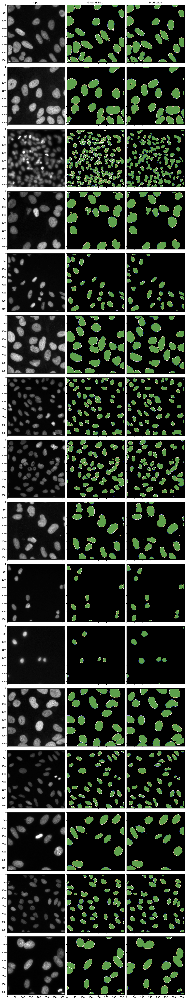

In [25]:
###########################################################################
# TASK 7 
#
# TODO: Your goal is to fine-tune your UNet model to achieve strong performance
# on the test dataset in terms of average pixelwise accuracy.
#
# Grading Criteria:
# - ≥ 95% accuracy: 10 points
# - ≥ 90% accuracy: 5 points
# - < 90% accuracy: 0 points
#
# Requirements:
# - Fine-tune your hyperparameters to achieve the best performance.
###########################################################################


# plot predicted results for test data
images, labels, predictions, mean_accuracy = simple_test(net, test_loader, activation, device)
print('Average pixelwise accuracy: {:.3f}'.format(mean_accuracy))

show_predictions(images, labels, predictions, prediction_type)

# 4. Instance Segmentation

## Postprocessing & Watershed

In contrast to the semantic segmentation the postprocessing to extract the final segmentation is a bit more involved and consists of x steps for the two class and three class models:
- We define a surface based on the prediction
- We extract the maxima from this surface
- We use the maxima as seeds in an off-the-shelf watershed algorithm
- Finally, we mask the result with the foreground.
The foreground areas covered by the watershed from each seed point correspond to the instances.

The resulting instances are then matched to the ground truth instances (at least 50% overlap) to get our final score (averaged over all instances and all test images)

average precision: 0.7419354838709677, precision: 0.9583333333333334, recall: 0.7666666666666667
true positives: 23, false positives: 1, false negatives: 7


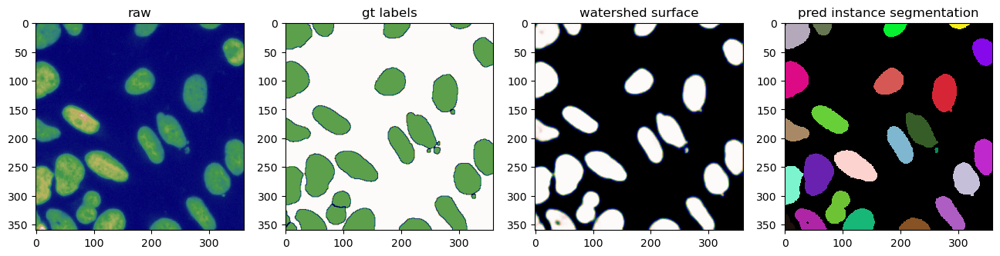

average precision: 0.9473684210526315, precision: 1.0, recall: 0.9473684210526315
true positives: 18, false positives: 0, false negatives: 1


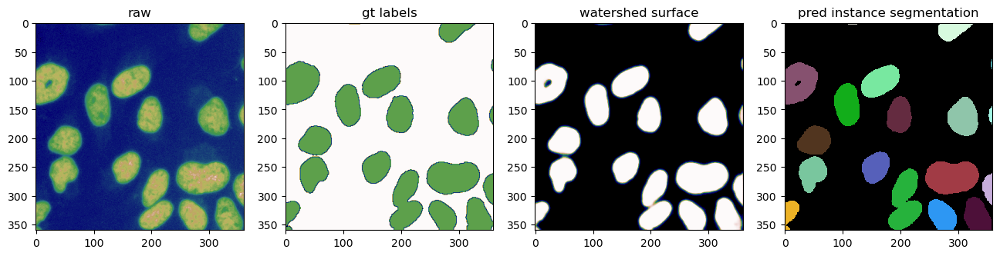

average precision: 0.30569948186528495, precision: 0.6210526315789474, recall: 0.37579617834394907
true positives: 59, false positives: 36, false negatives: 98


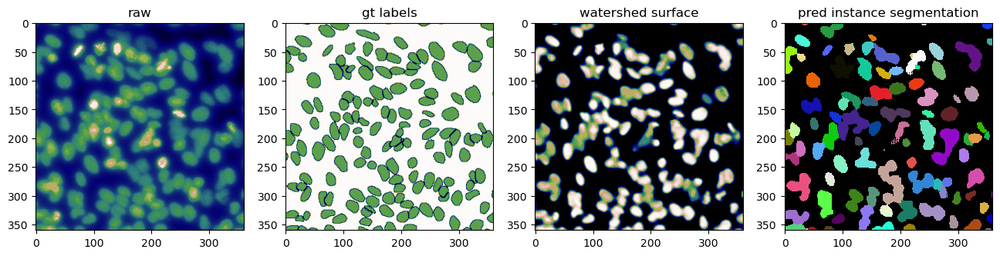

average precision: 0.8095238095238095, precision: 0.9444444444444444, recall: 0.85
true positives: 17, false positives: 1, false negatives: 3


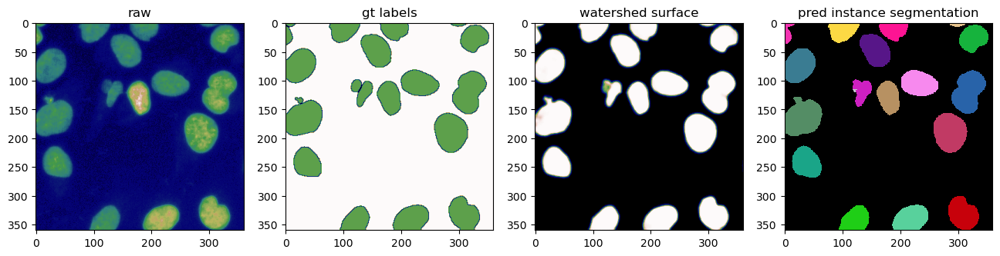

average precision: 0.8928571428571429, precision: 0.9259259259259259, recall: 0.9615384615384616
true positives: 25, false positives: 2, false negatives: 1


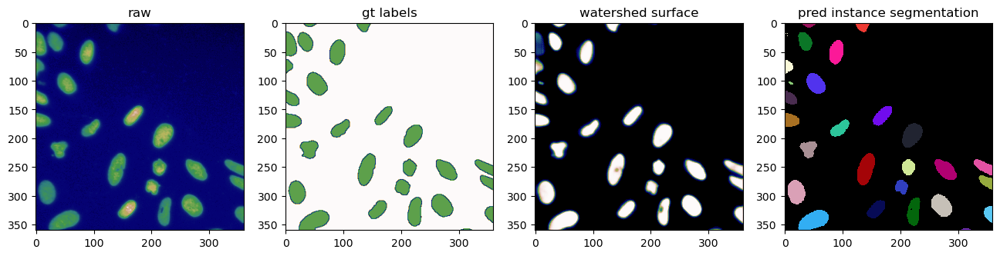

average precision: 0.76, precision: 0.9047619047619048, recall: 0.8260869565217391
true positives: 19, false positives: 2, false negatives: 4


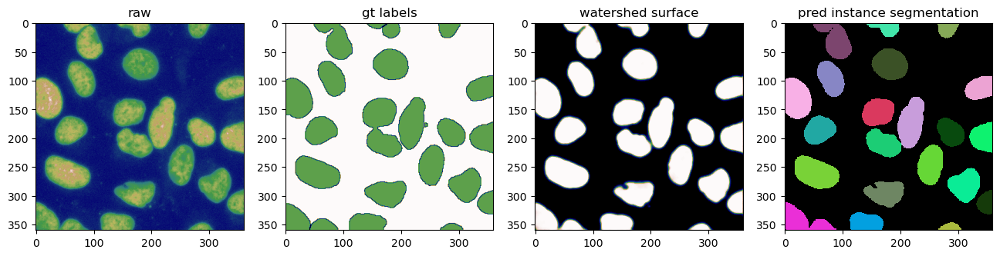

average precision: 0.8421052631578947, precision: 0.8888888888888888, recall: 0.9411764705882353
true positives: 48, false positives: 6, false negatives: 3


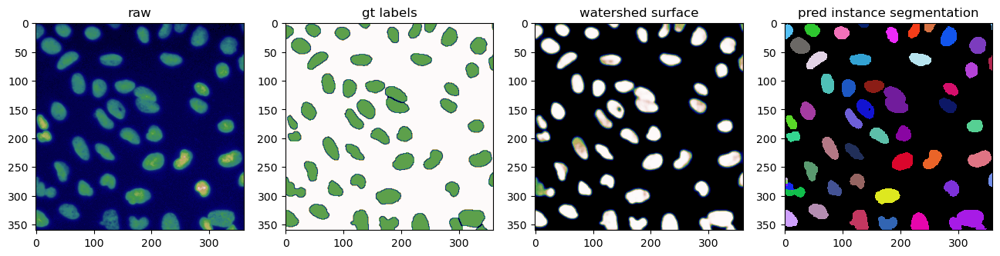

average precision: 0.7419354838709677, precision: 0.8679245283018868, recall: 0.8363636363636363
true positives: 46, false positives: 7, false negatives: 9


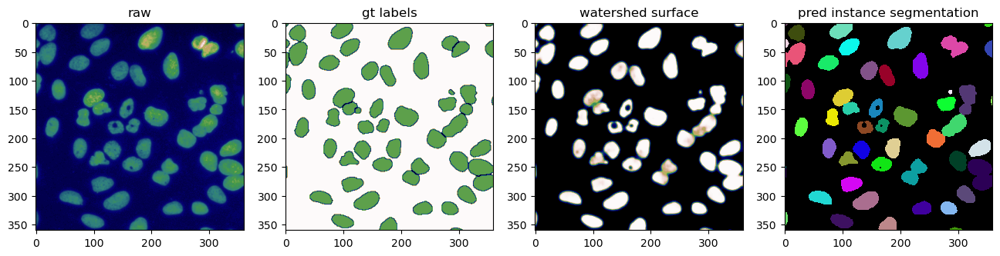

average precision: 0.9090909090909091, precision: 1.0, recall: 0.9090909090909091
true positives: 20, false positives: 0, false negatives: 2


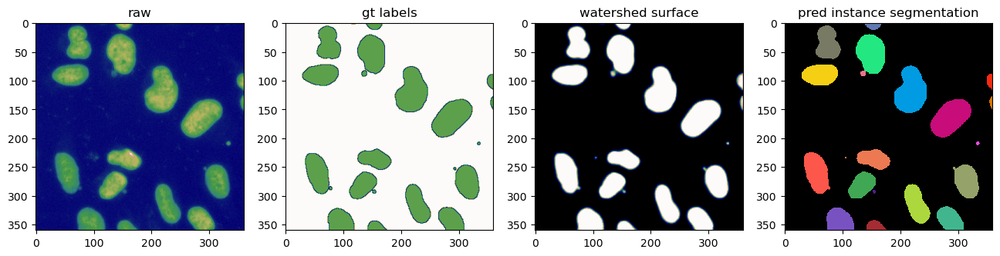

average precision: 0.6923076923076923, precision: 0.9, recall: 0.75
true positives: 9, false positives: 1, false negatives: 3


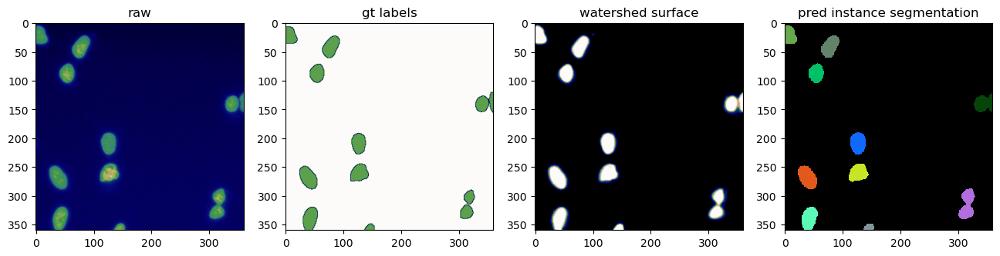

average precision: 0.1875, precision: 0.25, recall: 0.42857142857142855
true positives: 3, false positives: 9, false negatives: 4


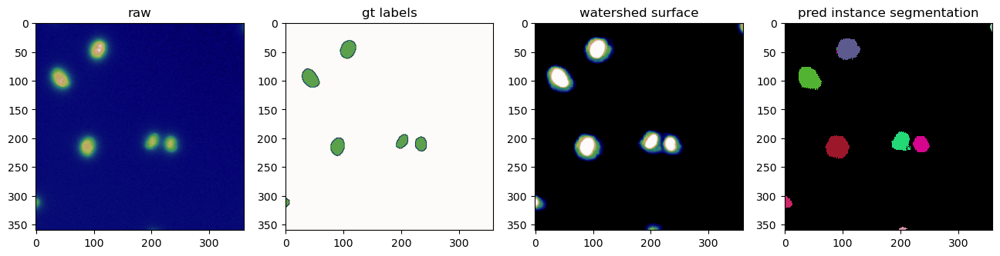

average precision: 0.85, precision: 1.0, recall: 0.85
true positives: 17, false positives: 0, false negatives: 3


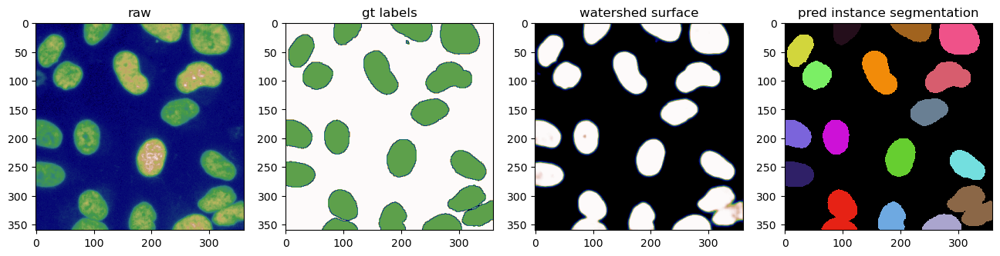

average precision: 0.95, precision: 1.0, recall: 0.95
true positives: 38, false positives: 0, false negatives: 2


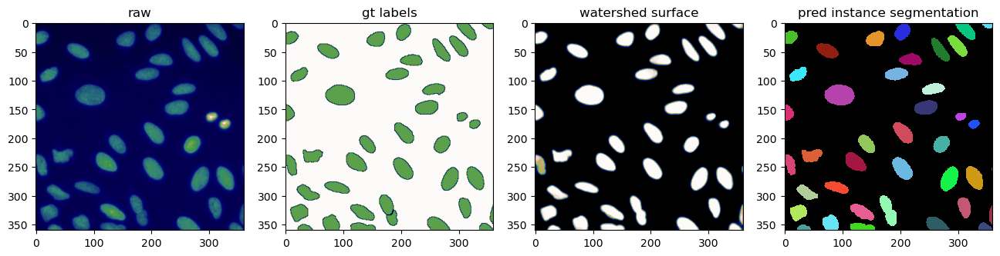

average precision: 0.8125, precision: 1.0, recall: 0.8125
true positives: 13, false positives: 0, false negatives: 3


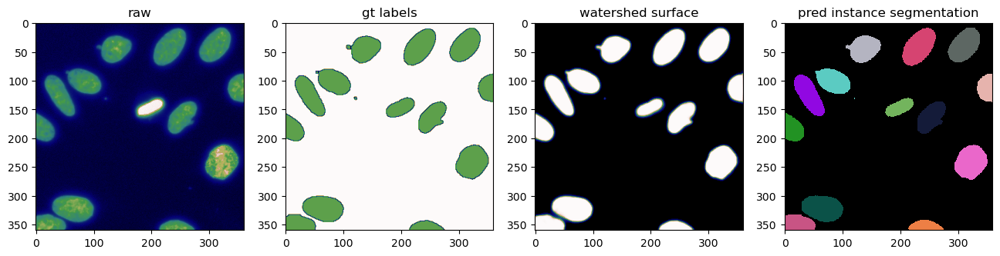

average precision: 0.8163265306122449, precision: 0.851063829787234, recall: 0.9523809523809523
true positives: 40, false positives: 7, false negatives: 2


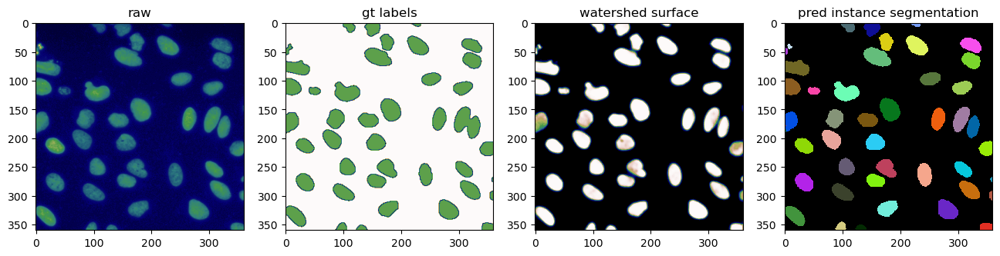

average precision: 0.7894736842105263, precision: 1.0, recall: 0.7894736842105263
true positives: 15, false positives: 0, false negatives: 4


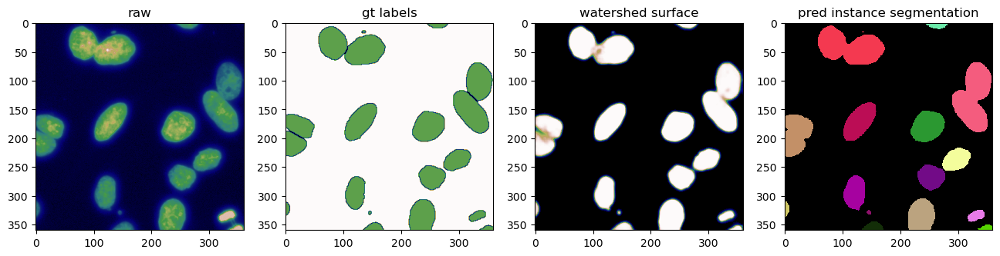

average precision on test set: 0.7530389939012544


In [26]:
# OPTIONAL TASK
# Finetune the watershed parameters and see how this affects the resulting instance segmentation.

if prediction_type.name == PredictionType.TWO_CLASS.name:
    fg_thresh = 0.7
    seed_thresh = 0.8
elif prediction_type.name == PredictionType.THREE_CLASS.name:
    fg_thresh = 0.5
    seed_thresh = 0.6
else:
    raise ValueError("Unknown prediction type")

test_evaluation_routine(net, test_loader, device, prediction_type, fg_thresh, seed_thresh, padding_size, data_test)